## Brick Alignment Check

#### General Description:
The bond or joint pattern of a masonry wall can have a significant influence on its flexural strength. The brick alignment classifier will check for the bond pattern in walls from wall images. Specifically, the classifier will distinguish between a compliant or a non-compliant wall, as defined on the basis of its proximity to a running bond or a stack bond respectively, as shown in the images below

<img src="img/alignmentcheck.png" width=300 height=300 >
<!-- <img src="wallnogo.png" width=125 height=125, img align="left" > -->

#### Threshold for compliance:
For a wall to be compliant on the basis of this check, the head joints in the successive rows of bricks should be horizontally offset by at least one quarter the unit length

#### Methodology of Check:
The current methodology setup for checking the bond pattern is as follows:
1. Process a wall image to get contours of bricks (Segmentation technique TBD)
2. From the contours, obtain the centroid point of each brick
3. Group the centroids corresponding to each row of bricks (approximated by comparing the y coordinate of centroid points)
4. Calculate the difference in x coordinates of successive rows
5. Divide the difference by the average unit length of the bricks being compared
6. If the horizontal offset is less than 0.25, the image is classified as "No Go", otherwise "Go"

#### Outputs:
 - “Go” or “No Go” label for compliant and non-compliant bond pattern respectively
 - The original image with the non-compliant rows highlighted
 - Overall score and percentage of compliant rows with respect to all the rows

#### Constraints
For the classifier to correctly identify the bond pattern, the input images submitted to the mobile app should meet the following requirements:
 - The input image should be cropped to show just the bricks and bond pattern (with the windows cropped out for instance)
 - If more than one wall is being checked at a time, a separate photo should be taken for each wall

***

## Step 1: Image Processing
In this check, the input images are processed in order to detect the bricks for further analysis

### Reusable methods
 - **Load Images**: Get all filepaths
 - **Display Images**: Display one, two, or multiple images
 - **Change Image Format**: Change image format to RGB, HSV, gray etc.
 - **Get Centroids**: Get centroids of bricks from a threshold image

#### Load Images

In [1]:
import os
import random


### CHANGE THE DIRECTORY PATH TO THE FOLDER WITH TEST IMAGES
dirpath = "C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM"+"/"

def loadImages(dirpath):
    filepaths  = [dirpath+file for file in os.listdir(dirpath)]
    random.shuffle(filepaths)
    return filepaths

#### Display images

In [2]:
%matplotlib inline
from matplotlib import pyplot as plt

# Display one image
def display_one(a, title1 = "Original", mode=None):
    plt.imshow(a,mode), plt.title(title1)
    plt.show()
    
# Display two images
def display_two(a, b, title1 = "Original", title2 = "Edited",mode=None):
    plt.subplot(121), plt.imshow(a,mode), plt.title(title1)
#     plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(b,mode), plt.title(title2)
#     plt.xticks([]), plt.yticks([])
    plt.show()
    
# Display multiple images
def display_many(images,titles,mode=None):
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(images):
        if img.shape[0] == 3:
            img = img.transpose(1,2,0)
        plt_idx = i+1
        plt.subplot(2, 3, plt_idx)
        plt.title(titles[i])
        plt.imshow(img,mode)
    plt.show()

#### Change Image Format

In [3]:
import cv2

def convert2gray(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def convert2rgb(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def convert2hsv(img):
    return cv2.cvtColor(img,cv2.COLOR_BGR2HSV) 

#### Get Centroids

In [4]:

def getcentroids(img,thresh): #Inputs: Original Image, Threshold Image

    # FIND CONTOURS
    contours_ag,h = cv2.findContours(thresh, cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
    
    
    # PARAMETERS TO FILTER CONTOURS
    l = img.shape[0:2][0]/10
    b = img.shape[0:2][1]/10
    avg_area = (img.shape[0:2][0]/10)*(img.shape[0:2][1]/10)
    digits   = len(str(round(avg_area)))-1
    roundoff = (int("1"+"0"*digits))
    avg_area = round(avg_area/roundoff)*roundoff
    print(digits,roundoff,avg_area)
    max_area = (avg_area*10)
    print("Average area", l,b,avg_area,max_area)

    centroids = []
    cXs = []
    cYs = []
    areas= []
    
    for c in contours_ag:
        area = cv2.contourArea(c)
#         print("AREA",area)
        areas.append(area)
        

        if area > avg_area and area<max_area:
            (x, y, w, h) = cv2.boundingRect(c)

            # Draw the contours
            #cv2.drawContours(img, [c], -1, (0, 255, 0), 2)

            # Get random color for each brick
            tpl = tuple([random.randint(0, 255) for _ in range(3)])
            cv2.rectangle(img, (x, y), (x + w, y + h), tpl, -1)
            
            # calculate moments for each contour
            M = cv2.moments(c)
        
            # calculate x,y coordinate of center
            cX = int(M["m10"] / M["m00"])
            cY = int(M["m01"] / M["m00"])
            centroids.append([cX,cY])
            cXs.append(cX)
            cYs.append(cY)
            cv2.circle(img, (cX, cY), 5, (255, 255, 255), -1)
            cv2.putText(img, "centroid", (cX - 25, cY - 25),cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)            
            
    #Display Images
    display_two(thresh,img,title1="THRESHOLD",title2="CENTROIDS FROM CONTOURS",mode="gray")
    print("No. of Centroids: ",len(centroids))
    
#     print(areas)

    return centroids

***
### Process Images



#### 1.1 Thresholding & Centroid Extraction
 - Apply different thresholding techniques to process images
 - Extract centroid from the threshold image

#### Method 1: 
**Convert to HSV, get saturation, & apply adaptive gaussian threshold**

In [5]:
## This method currently works for the BIM Generated Images, but not on the real wall images

def adaptivegaussian(filepath):
    img = cv2.imread(filepath)
    
    # CONVERT TO RGB
    rgb = convert2rgb(img)
    
    #CONVERT TO GRAY
    gray = convert2gray(img)

    
    #CONVERT TO HSV
    hsv = convert2hsv(img)
    
    # GET SATURATION FROM HSV
    S=hsv[:,:,1]
    

    # APPLY ADAPTIVE GAUSSIAN THRESHOLD
    th_ag = cv2.adaptiveThreshold(S,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY,11,2)
    
    display_two(rgb,gray,title2="GRAY",mode="gray")
    
    ## GET CENTROIDS
    centroids = getcentroids(rgb,th_ag)
    

#### Method 1 Results:

IMAGE  1 , NAME:  T_BA_NoGo_2063_Gen4_0302_69_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2063_Gen4_0302_69_0.png


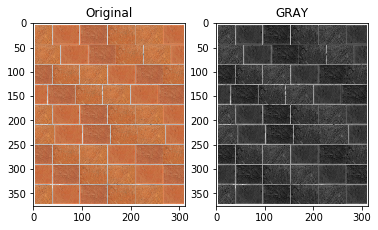

3 1000 1000
Average area 37.6 31.3 1000 10000


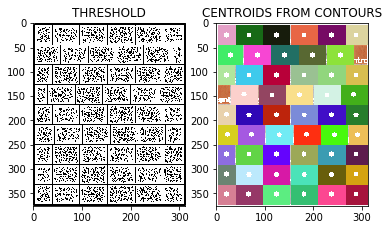

No. of Centroids:  52
IMAGE  2 , NAME:  T_BA_Go_1003_Gen3_0229_309_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1003_Gen3_0229_309_0.png


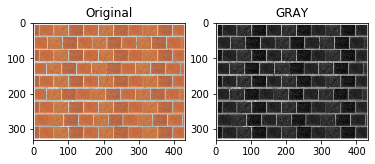

3 1000 1000
Average area 33.2 43.3 1000 10000


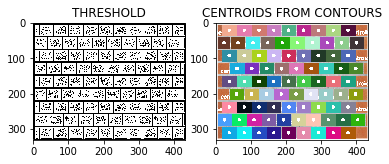

No. of Centroids:  83
IMAGE  3 , NAME:  T_BA_NoGo_2065_Gen4_0302_71_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2065_Gen4_0302_71_1.png


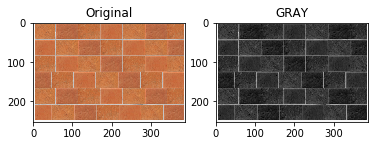

2 100 1000
Average area 25.3 38.8 1000 10000


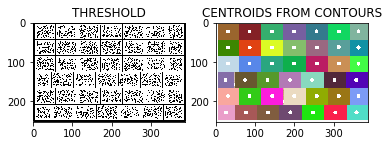

No. of Centroids:  42
IMAGE  4 , NAME:  T_BA_NoGo_2063_Gen4_0302_69_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2063_Gen4_0302_69_2.png


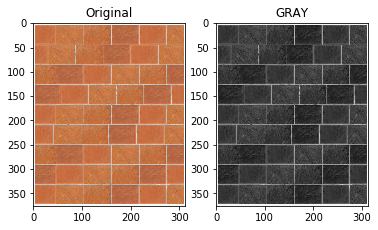

3 1000 1000
Average area 37.6 31.3 1000 10000


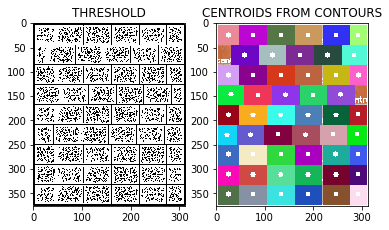

No. of Centroids:  52
IMAGE  5 , NAME:  T_BA_NoGo_2058_Gen4_0302_64_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2058_Gen4_0302_64_1.png


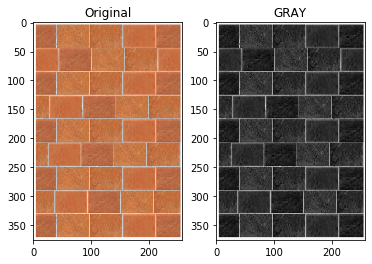

2 100 1000
Average area 37.6 25.8 1000 10000


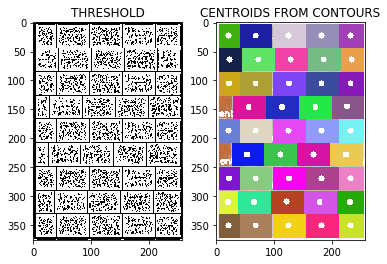

No. of Centroids:  43
IMAGE  6 , NAME:  T_BA_Go_1002_Gen3_0229_308_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1002_Gen3_0229_308_0.png


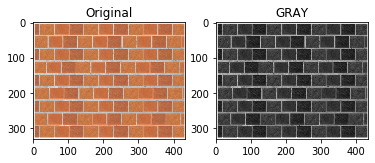

3 1000 1000
Average area 33.2 43.4 1000 10000


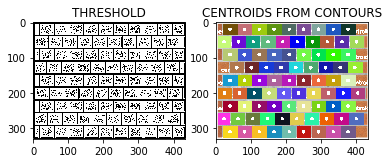

No. of Centroids:  84
IMAGE  7 , NAME:  T_BA_Go_1001_Gen3_0229_307_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1001_Gen3_0229_307_1.png


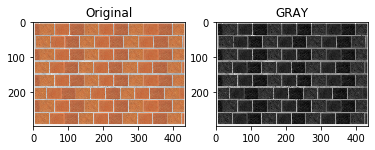

3 1000 1000
Average area 29.6 43.5 1000 10000


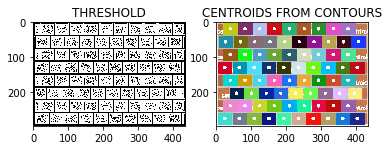

No. of Centroids:  75
IMAGE  8 , NAME:  T_BA_Go_1000_Gen3_0229_306_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1000_Gen3_0229_306_1.png


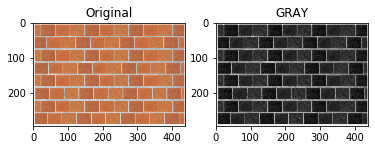

3 1000 1000
Average area 29.6 43.8 1000 10000


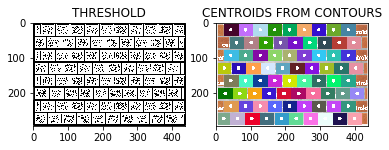

No. of Centroids:  75
IMAGE  9 , NAME:  T_BA_NoGo_2057_Gen4_0302_63_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2057_Gen4_0302_63_2.png


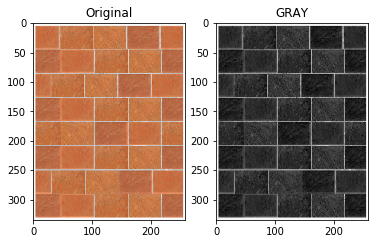

2 100 900
Average area 33.5 25.9 900 9000


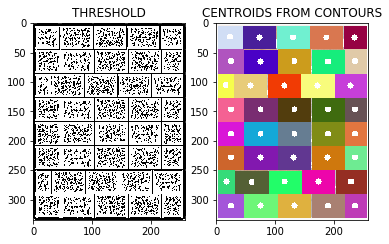

No. of Centroids:  40
IMAGE  10 , NAME:  T_BA_Go_1000_Gen3_0229_306_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1000_Gen3_0229_306_2.png


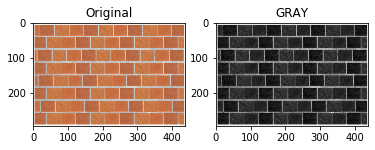

3 1000 1000
Average area 29.6 43.8 1000 10000


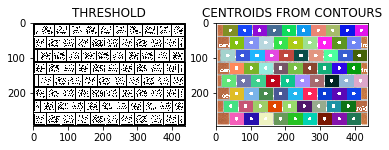

No. of Centroids:  75
IMAGE  11 , NAME:  T_BA_NoGo_2065_Gen4_0302_71_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2065_Gen4_0302_71_2.png


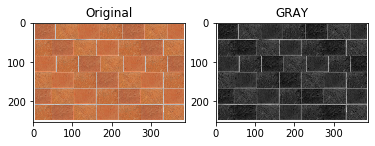

2 100 1000
Average area 25.3 38.8 1000 10000


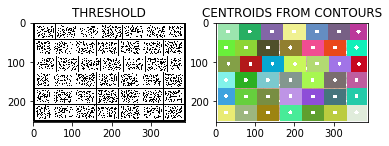

No. of Centroids:  42
IMAGE  12 , NAME:  T_BA_Go_1002_Gen3_0229_308_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1002_Gen3_0229_308_2.png


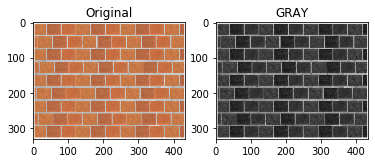

3 1000 1000
Average area 33.2 43.4 1000 10000


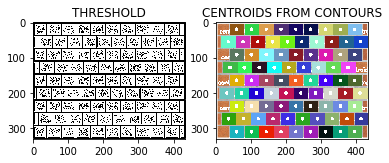

No. of Centroids:  84
IMAGE  13 , NAME:  T_BA_Go_1003_Gen3_0229_309_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1003_Gen3_0229_309_1.png


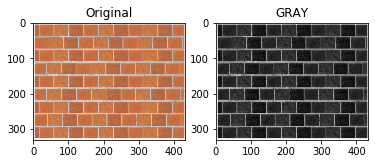

3 1000 1000
Average area 33.2 43.3 1000 10000


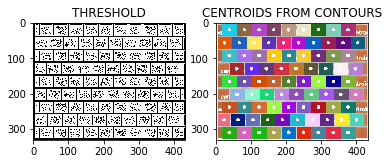

No. of Centroids:  83
IMAGE  14 , NAME:  T_BA_NoGo_2064_Gen4_0302_70_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2064_Gen4_0302_70_0.png


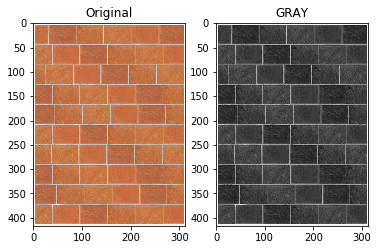

3 1000 1000
Average area 41.7 31.3 1000 10000


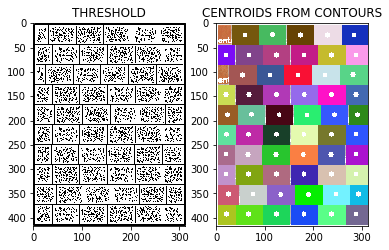

No. of Centroids:  58
IMAGE  15 , NAME:  T_BA_NoGo_2064_Gen4_0302_70_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2064_Gen4_0302_70_1.png


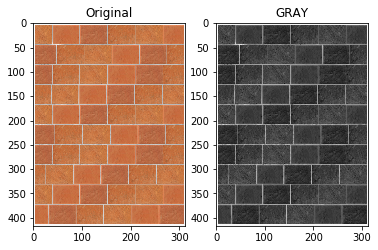

3 1000 1000
Average area 41.7 31.3 1000 10000


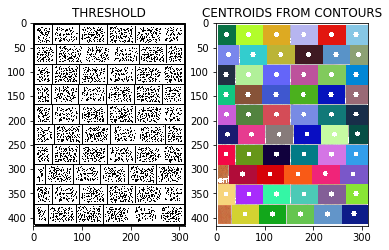

No. of Centroids:  58
IMAGE  16 , NAME:  T_BA_NoGo_2063_Gen4_0302_69_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2063_Gen4_0302_69_1.png


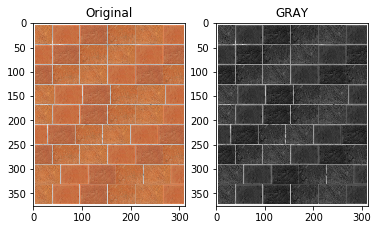

3 1000 1000
Average area 37.6 31.3 1000 10000


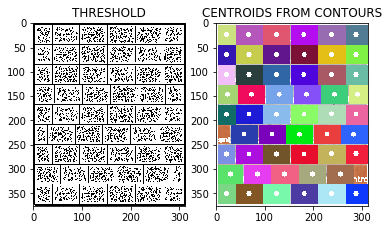

No. of Centroids:  52
IMAGE  17 , NAME:  T_BA_NoGo_2060_Gen4_0302_66_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2060_Gen4_0302_66_1.png


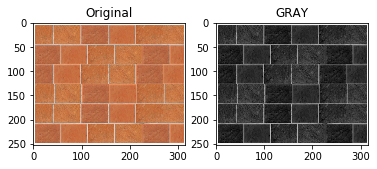

2 100 800
Average area 25.3 31.6 800 8000


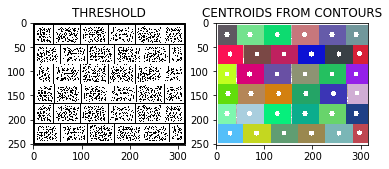

No. of Centroids:  36
IMAGE  18 , NAME:  T_BA_Go_1000_Gen3_0229_306_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1000_Gen3_0229_306_0.png


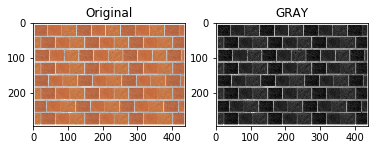

3 1000 1000
Average area 29.6 43.8 1000 10000


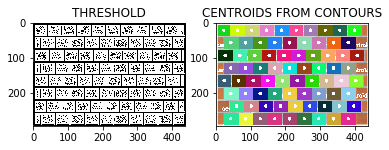

No. of Centroids:  75
IMAGE  19 , NAME:  T_BA_NoGo_2058_Gen4_0302_64_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2058_Gen4_0302_64_2.png


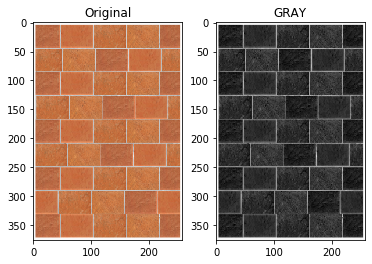

2 100 1000
Average area 37.6 25.8 1000 10000


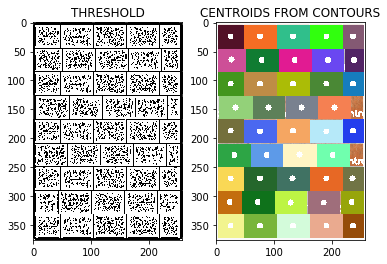

No. of Centroids:  43
IMAGE  20 , NAME:  T_BA_Go_1001_Gen3_0229_307_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1001_Gen3_0229_307_2.png


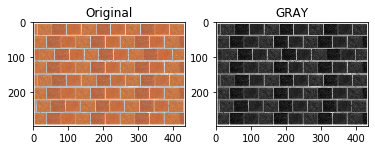

3 1000 1000
Average area 29.6 43.5 1000 10000


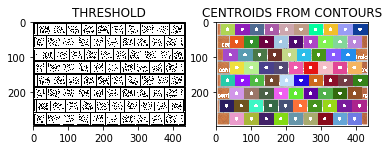

No. of Centroids:  75
IMAGE  21 , NAME:  T_BA_NoGo_2059_Gen4_0302_65_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2059_Gen4_0302_65_2.png


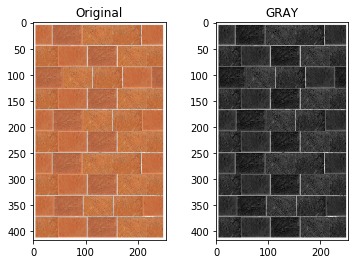

3 1000 1000
Average area 41.7 25.4 1000 10000


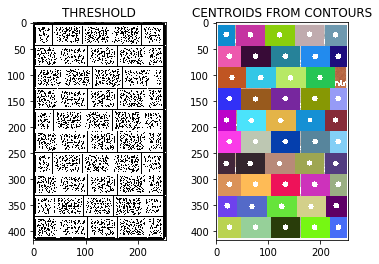

No. of Centroids:  49
IMAGE  22 , NAME:  T_BA_NoGo_2058_Gen4_0302_64_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2058_Gen4_0302_64_0.png


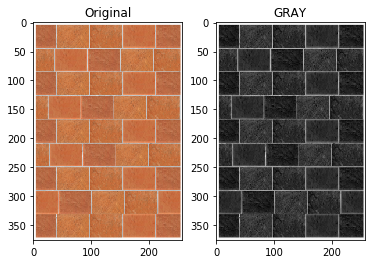

2 100 1000
Average area 37.6 25.8 1000 10000


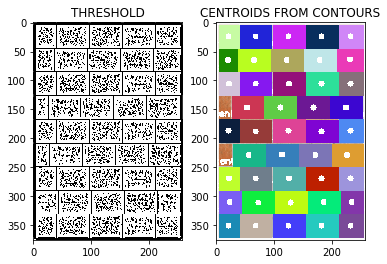

No. of Centroids:  43
IMAGE  23 , NAME:  T_BA_NoGo_2059_Gen4_0302_65_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2059_Gen4_0302_65_0.png


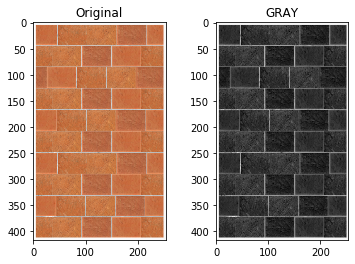

3 1000 1000
Average area 41.7 25.4 1000 10000


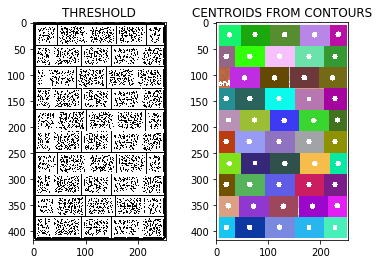

No. of Centroids:  49
IMAGE  24 , NAME:  T_BA_Go_1004_Gen3_0229_31_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1004_Gen3_0229_31_0.png


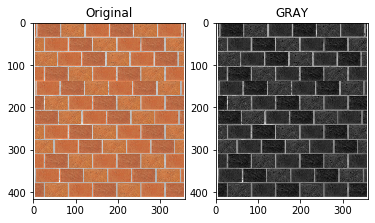

3 1000 2000
Average area 41.7 36.0 2000 20000


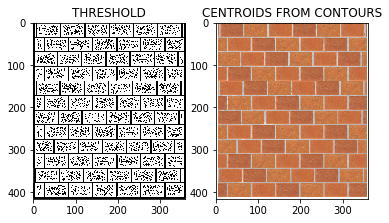

No. of Centroids:  0
IMAGE  25 , NAME:  T_BA_NoGo_2065_Gen4_0302_71_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2065_Gen4_0302_71_0.png


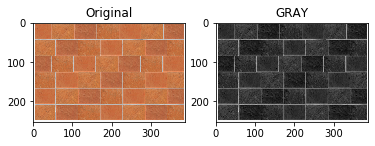

2 100 1000
Average area 25.3 38.8 1000 10000


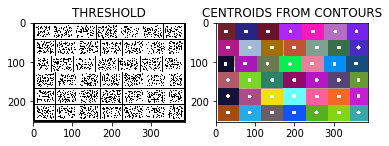

No. of Centroids:  42
IMAGE  26 , NAME:  T_BA_NoGo_2062_Gen4_0302_68_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2062_Gen4_0302_68_1.png


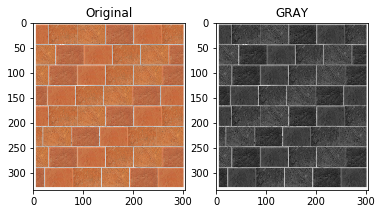

3 1000 1000
Average area 33.5 30.5 1000 10000


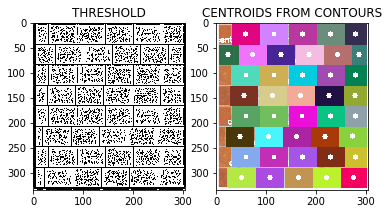

No. of Centroids:  41
IMAGE  27 , NAME:  T_BA_NoGo_2064_Gen4_0302_70_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2064_Gen4_0302_70_2.png


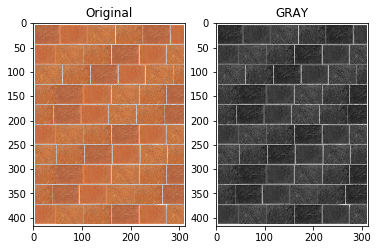

3 1000 1000
Average area 41.7 31.3 1000 10000


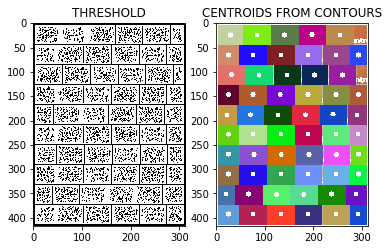

No. of Centroids:  58
IMAGE  28 , NAME:  T_BA_NoGo_2057_Gen4_0302_63_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2057_Gen4_0302_63_1.png


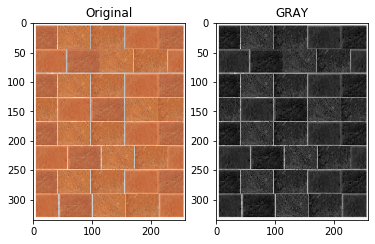

2 100 900
Average area 33.5 25.9 900 9000


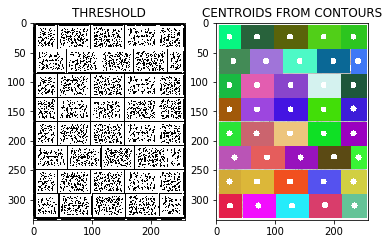

No. of Centroids:  40
IMAGE  29 , NAME:  T_BA_Go_1004_Gen3_0229_31_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1004_Gen3_0229_31_1.png


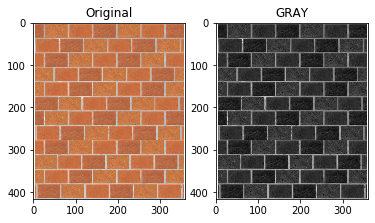

3 1000 2000
Average area 41.7 36.0 2000 20000


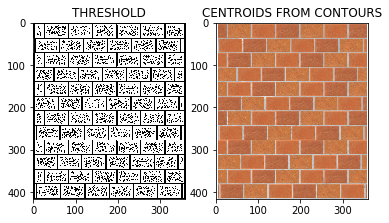

No. of Centroids:  0
IMAGE  30 , NAME:  T_BA_NoGo_2066_Gen4_0302_72_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2066_Gen4_0302_72_0.png


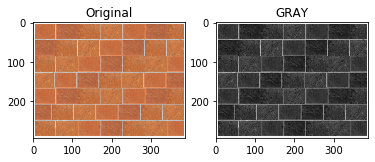

3 1000 1000
Average area 29.4 38.8 1000 10000


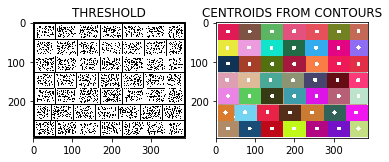

No. of Centroids:  49
IMAGE  31 , NAME:  T_BA_Go_1004_Gen3_0229_31_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_Go_1004_Gen3_0229_31_2.png


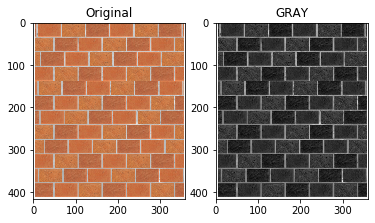

3 1000 2000
Average area 41.7 36.0 2000 20000


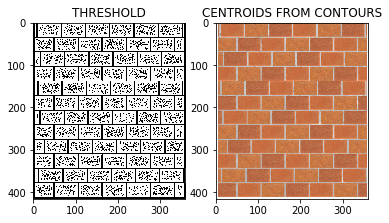

No. of Centroids:  0
IMAGE  32 , NAME:  T_BA_NoGo_2059_Gen4_0302_65_1.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2059_Gen4_0302_65_1.png


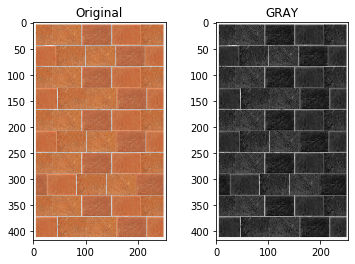

3 1000 1000
Average area 41.7 25.4 1000 10000


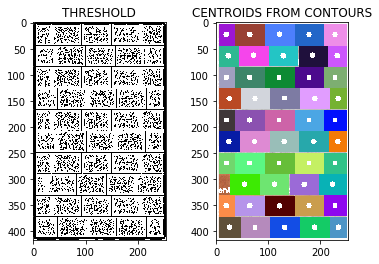

No. of Centroids:  49
IMAGE  33 , NAME:  T_BA_NoGo_2062_Gen4_0302_68_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2062_Gen4_0302_68_2.png


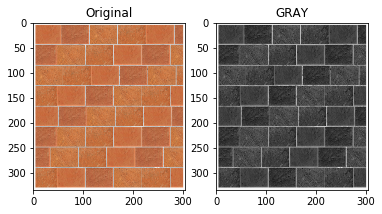

3 1000 1000
Average area 33.5 30.5 1000 10000


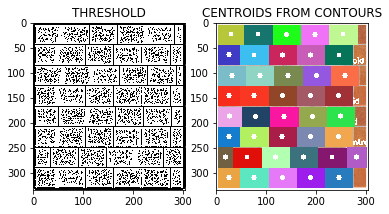

No. of Centroids:  41
IMAGE  34 , NAME:  T_BA_NoGo_2060_Gen4_0302_66_2.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2060_Gen4_0302_66_2.png


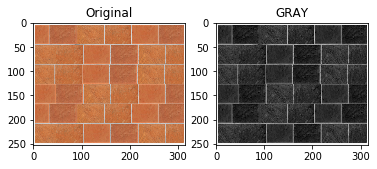

2 100 800
Average area 25.3 31.6 800 8000


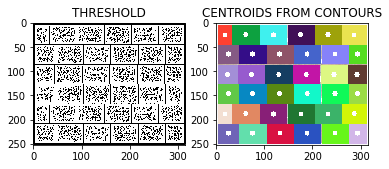

No. of Centroids:  36
IMAGE  35 , NAME:  T_BA_NoGo_2057_Gen4_0302_63_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2057_Gen4_0302_63_0.png


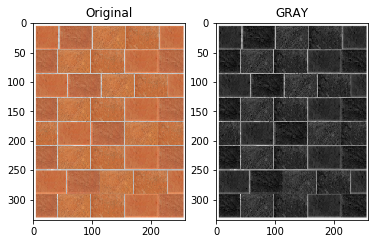

2 100 900
Average area 33.5 25.9 900 9000


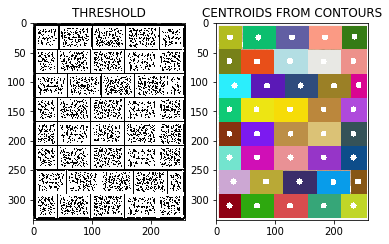

No. of Centroids:  40
IMAGE  36 , NAME:  T_BA_NoGo_2060_Gen4_0302_66_0.png 
PATH: C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images BIM/T_BA_NoGo_2060_Gen4_0302_66_0.png


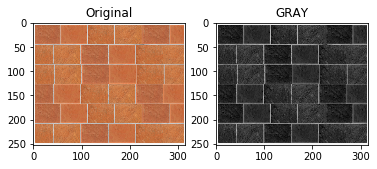

2 100 800
Average area 25.3 31.6 800 8000


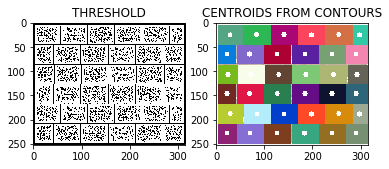

No. of Centroids:  36


In [6]:
### BIM IMAGES

global dirpath
bimimagespath = loadImages(dirpath)
def main(dirpath):  
    for i,filepath in enumerate(bimimagespath):
        print("IMAGE ",i+1,", NAME: ",os.path.basename(filepath), "\nPATH:",filepath)
        centroids = adaptivegaussian(filepath)
main(dirpath)

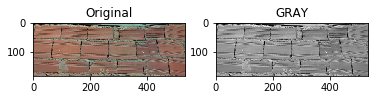

2 100 1000
Average area 18.5 53.3 1000 10000


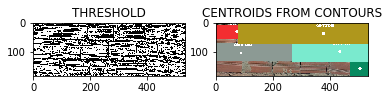

No. of Centroids:  10


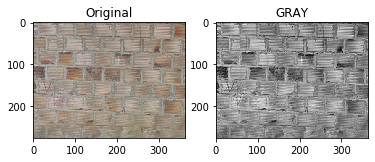

3 1000 1000
Average area 27.6 36.4 1000 10000


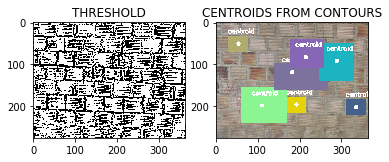

No. of Centroids:  7


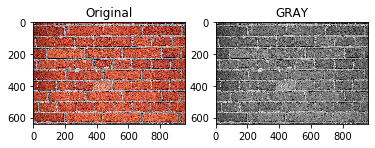

3 1000 6000
Average area 64.0 96.0 6000 60000


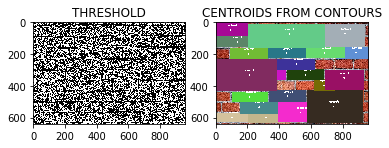

No. of Centroids:  23


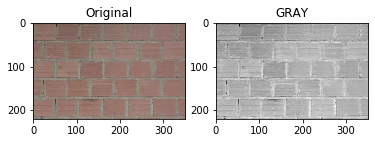

2 100 800
Average area 22.1 35.1 800 8000


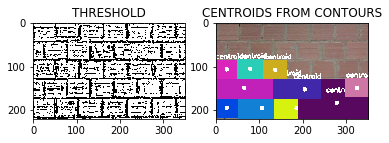

No. of Centroids:  11


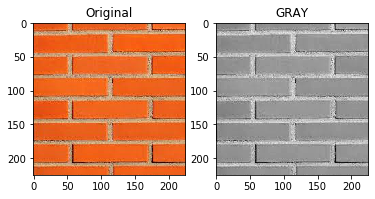

2 100 500
Average area 22.5 22.5 500 5000


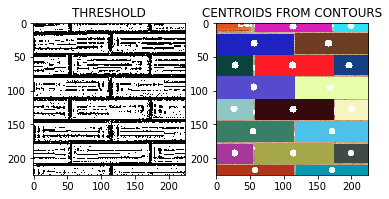

No. of Centroids:  19


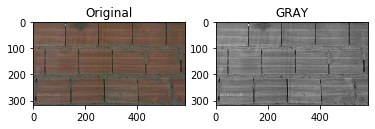

3 1000 2000
Average area 31.7 58.5 2000 20000


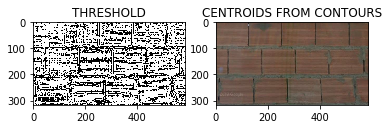

No. of Centroids:  0


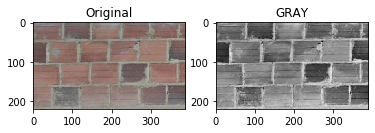

2 100 900
Average area 22.1 38.9 900 9000


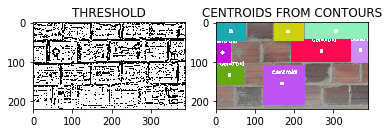

No. of Centroids:  8


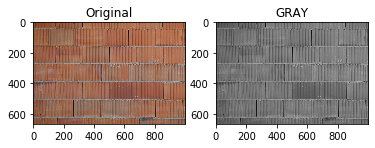

3 1000 7000
Average area 66.7 100.0 7000 70000


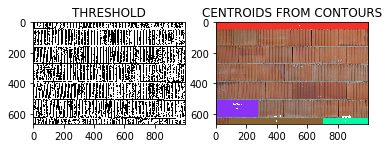

No. of Centroids:  4


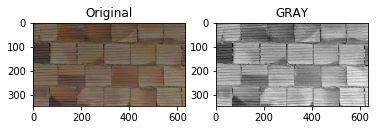

3 1000 2000
Average area 34.5 63.4 2000 20000


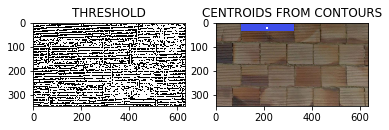

No. of Centroids:  1


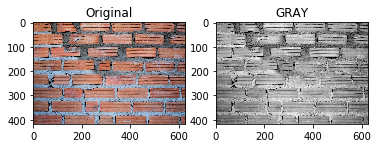

3 1000 3000
Average area 41.7 62.6 3000 30000


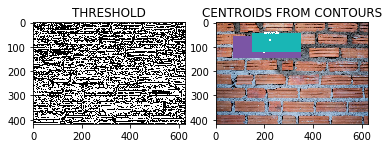

No. of Centroids:  2


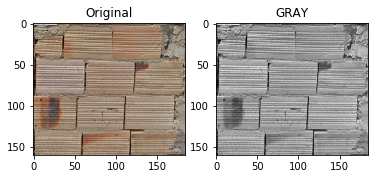

2 100 300
Average area 16.0 18.5 300 3000


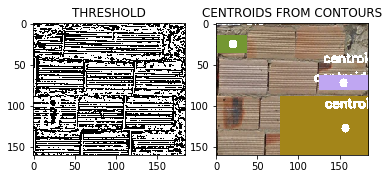

No. of Centroids:  4


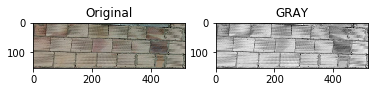

2 100 800
Average area 15.4 51.9 800 8000


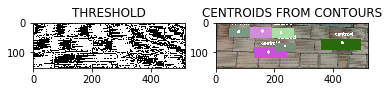

No. of Centroids:  6


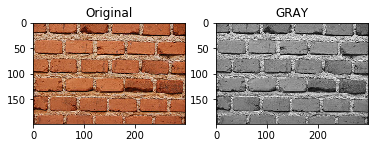

2 100 600
Average area 19.9 30.0 600 6000


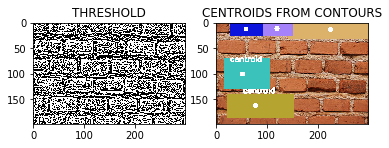

No. of Centroids:  5


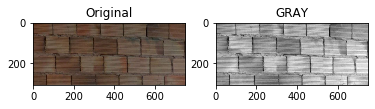

3 1000 2000
Average area 30.6 74.9 2000 20000


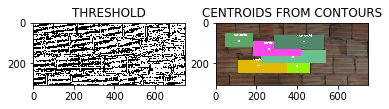

No. of Centroids:  6


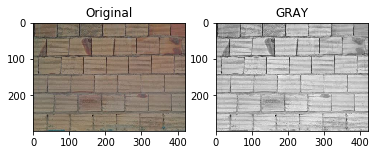

3 1000 1000
Average area 30.0 42.2 1000 10000


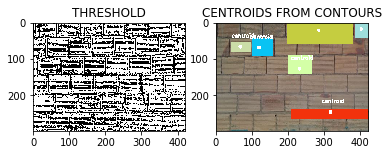

No. of Centroids:  6


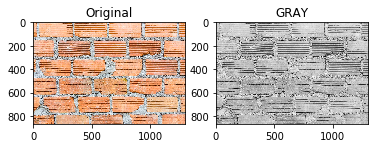

4 10000 10000
Average area 86.6 130.0 10000 100000


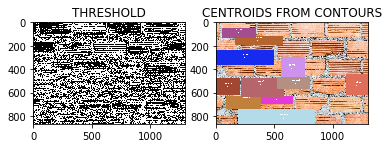

No. of Centroids:  11


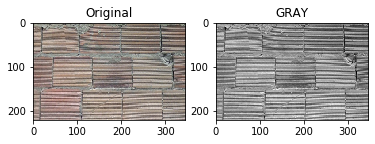

2 100 800
Average area 22.1 34.6 800 8000


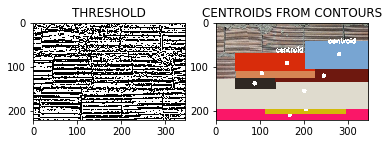

No. of Centroids:  8


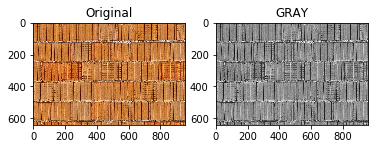

3 1000 6000
Average area 64.2 95.7 6000 60000


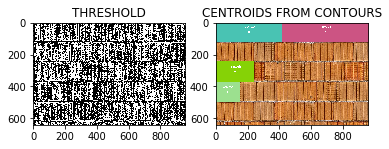

No. of Centroids:  4


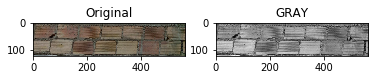

2 100 700
Average area 12.3 56.5 700 7000


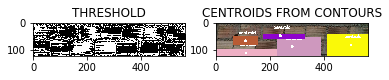

No. of Centroids:  5


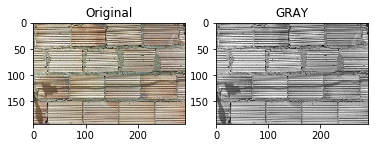

2 100 600
Average area 19.4 29.2 600 6000


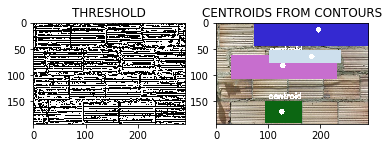

No. of Centroids:  4


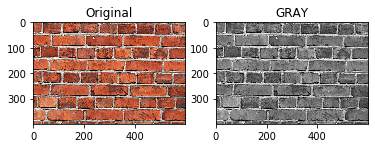

3 1000 2000
Average area 40.0 60.0 2000 20000


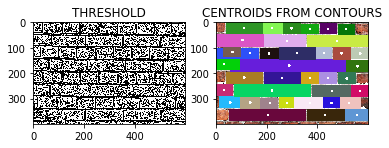

No. of Centroids:  38


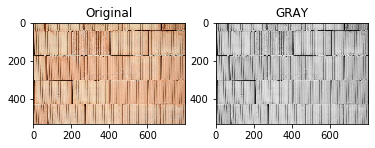

3 1000 4000
Average area 53.0 80.0 4000 40000


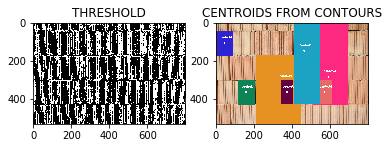

No. of Centroids:  7


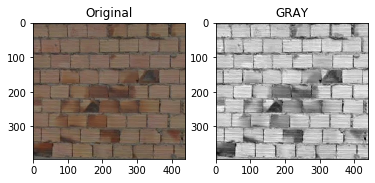

3 1000 2000
Average area 39.4 44.0 2000 20000


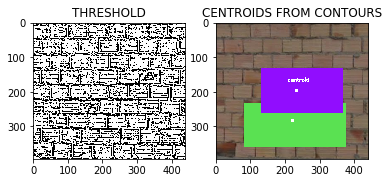

No. of Centroids:  2


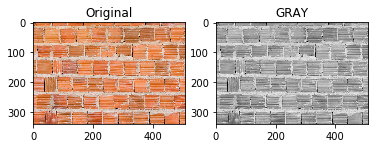

3 1000 2000
Average area 33.9 50.9 2000 20000


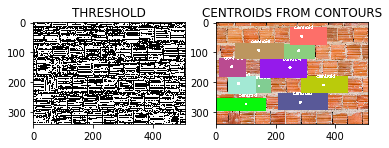

No. of Centroids:  10


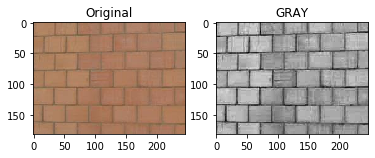

2 100 400
Average area 18.1 24.7 400 4000


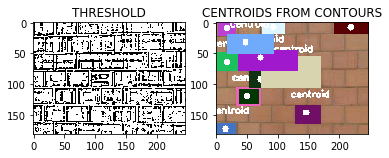

No. of Centroids:  12


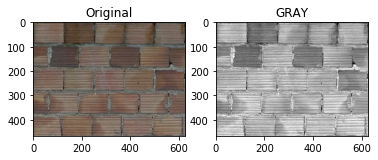

3 1000 3000
Average area 46.7 62.6 3000 30000


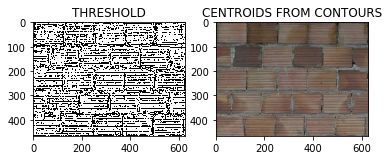

No. of Centroids:  0


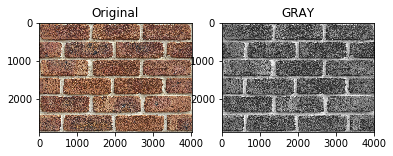

5 100000 100000
Average area 287.3 401.4 100000 1000000


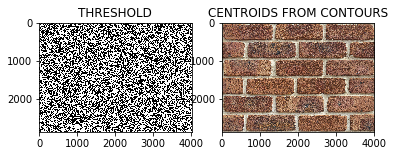

No. of Centroids:  0


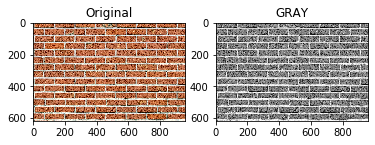

3 1000 6000
Average area 61.8 96.0 6000 60000


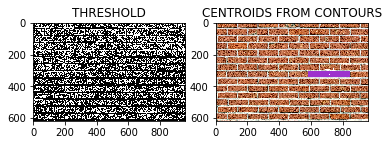

No. of Centroids:  1


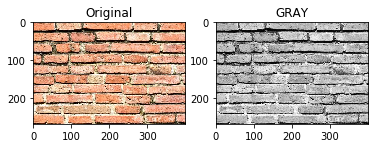

3 1000 1000
Average area 26.7 40.0 1000 10000


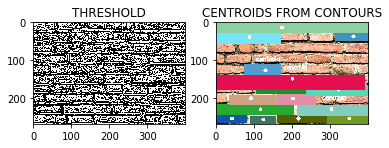

No. of Centroids:  15


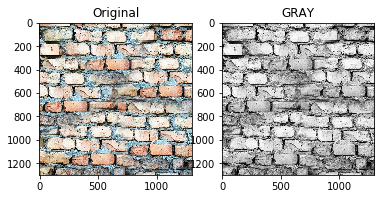

4 10000 20000
Average area 130.0 130.0 20000 200000


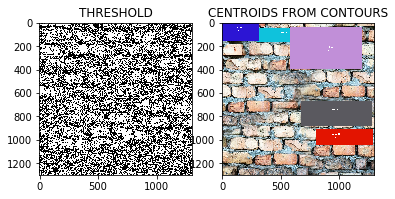

No. of Centroids:  5


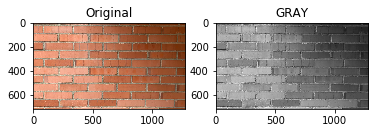

3 1000 9000
Average area 72.0 128.0 9000 90000


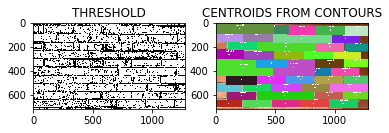

No. of Centroids:  44


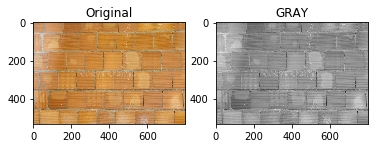

3 1000 4000
Average area 53.3 80.0 4000 40000


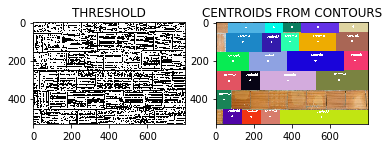

No. of Centroids:  23


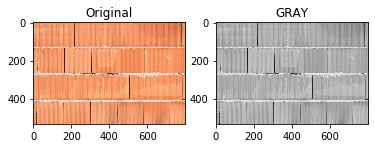

3 1000 4000
Average area 53.3 80.0 4000 40000


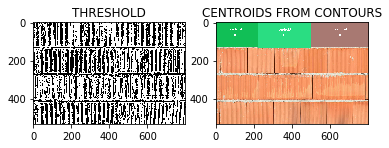

No. of Centroids:  3


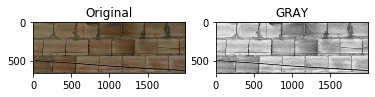

4 10000 10000
Average area 66.0 199.5 10000 100000


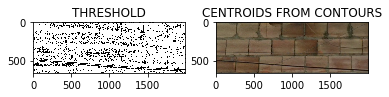

No. of Centroids:  0


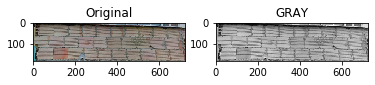

3 1000 1000
Average area 17.9 72.3 1000 10000


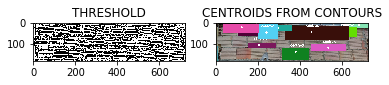

No. of Centroids:  10


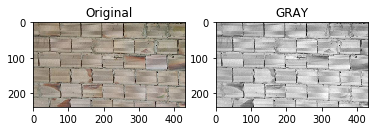

3 1000 1000
Average area 24.0 43.2 1000 10000


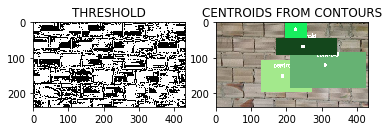

No. of Centroids:  4


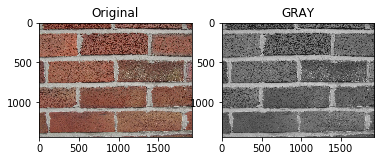

4 10000 30000
Average area 144.0 192.0 30000 300000


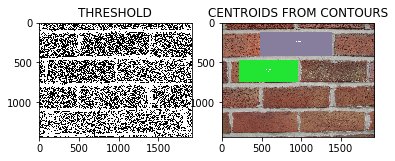

No. of Centroids:  2


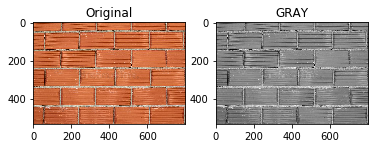

3 1000 4000
Average area 53.3 80.0 4000 40000


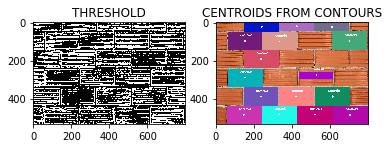

No. of Centroids:  16


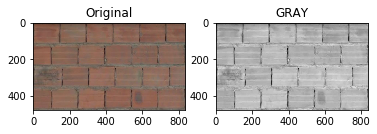

3 1000 4000
Average area 47.8 83.7 4000 40000


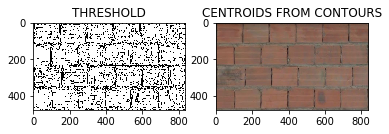

No. of Centroids:  0


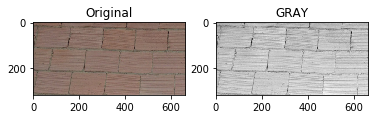

3 1000 2000
Average area 31.5 66.2 2000 20000


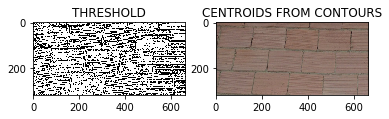

No. of Centroids:  0


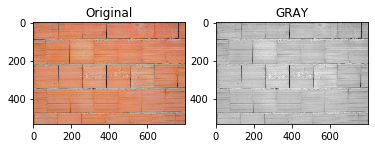

3 1000 4000
Average area 53.3 80.0 4000 40000


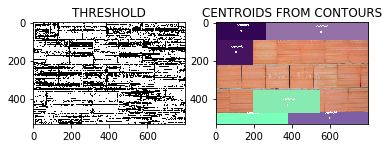

No. of Centroids:  6


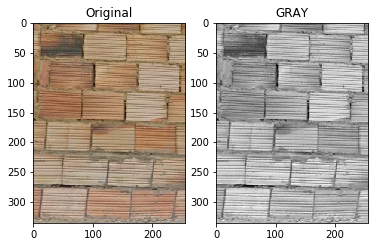

2 100 900
Average area 33.6 25.6 900 9000


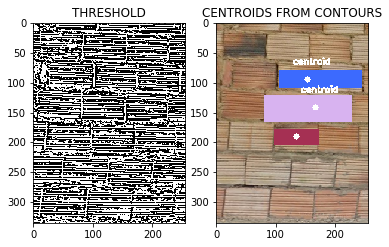

No. of Centroids:  3


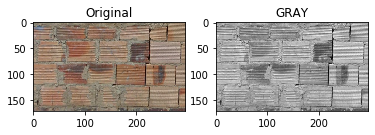

2 100 500
Average area 17.2 29.6 500 5000


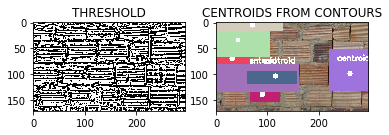

No. of Centroids:  7


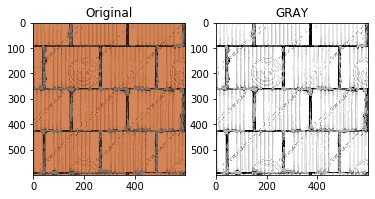

3 1000 4000
Average area 60.0 60.0 4000 40000


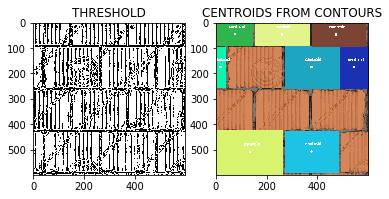

No. of Centroids:  8


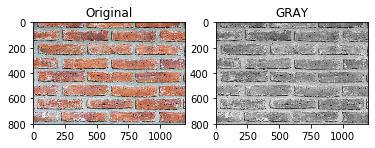

3 1000 10000
Average area 80.1 120.0 10000 100000


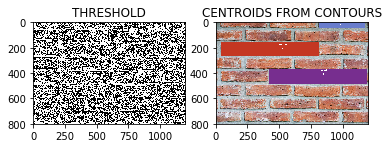

No. of Centroids:  3


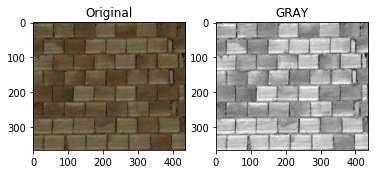

3 1000 2000
Average area 36.5 43.6 2000 20000


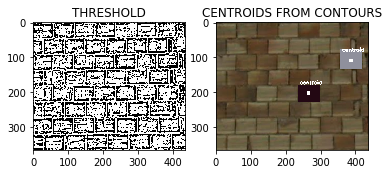

No. of Centroids:  2


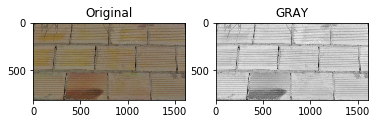

4 10000 10000
Average area 81.7 161.0 10000 100000


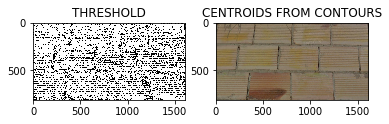

No. of Centroids:  0


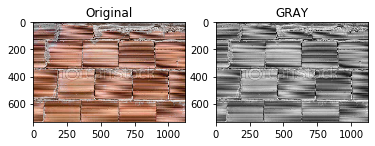

3 1000 8000
Average area 73.5 112.5 8000 80000


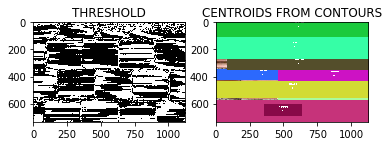

No. of Centroids:  10


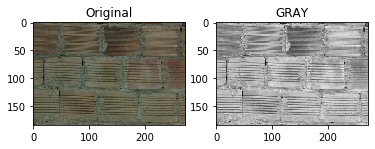

2 100 500
Average area 18.4 27.3 500 5000


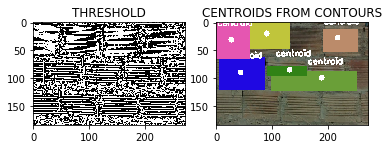

No. of Centroids:  6


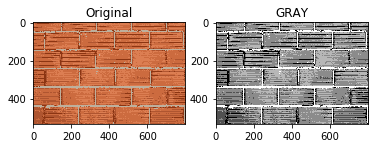

3 1000 4000
Average area 53.3 80.0 4000 40000


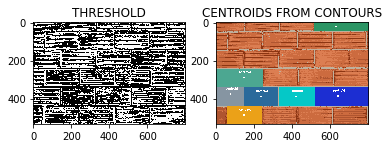

No. of Centroids:  7


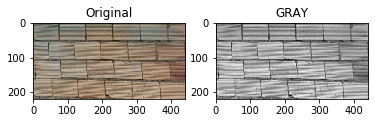

2 100 1000
Average area 22.0 44.1 1000 10000


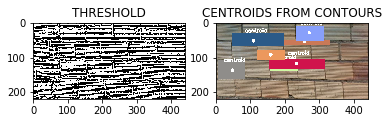

No. of Centroids:  7


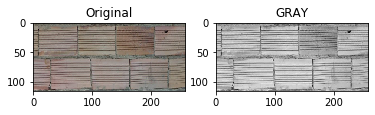

2 100 300
Average area 11.6 25.9 300 3000


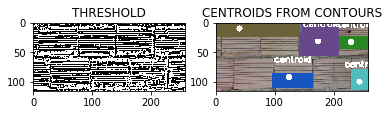

No. of Centroids:  6


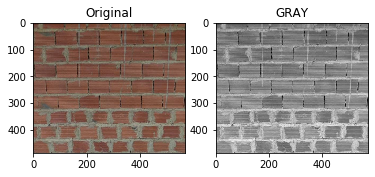

3 1000 3000
Average area 48.7 57.1 3000 30000


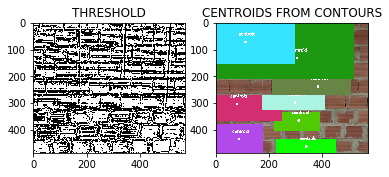

No. of Centroids:  8


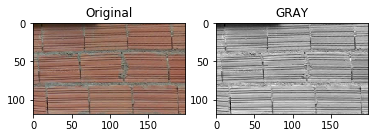

2 100 200
Average area 11.9 19.9 200 2000


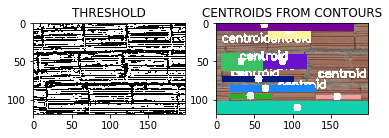

No. of Centroids:  9


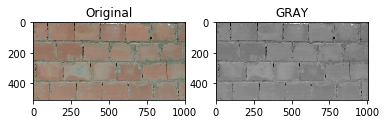

3 1000 5000
Average area 51.1 100.4 5000 50000


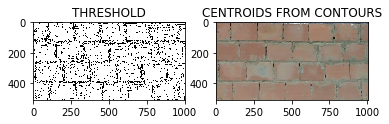

No. of Centroids:  0


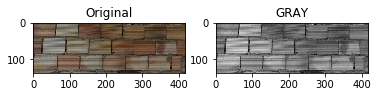

2 100 600
Average area 13.8 41.8 600 6000


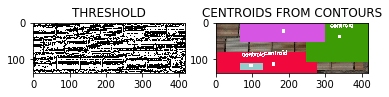

No. of Centroids:  4


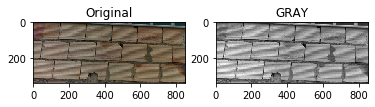

3 1000 3000
Average area 33.9 85.3 3000 30000


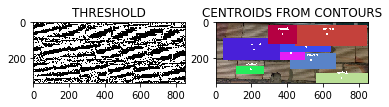

No. of Centroids:  9


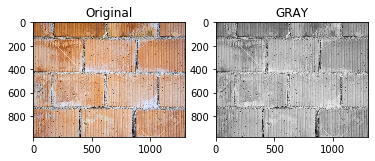

4 10000 10000
Average area 97.7 130.0 10000 100000


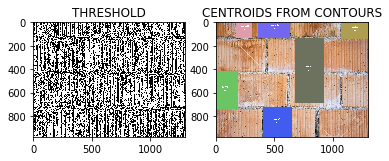

No. of Centroids:  6


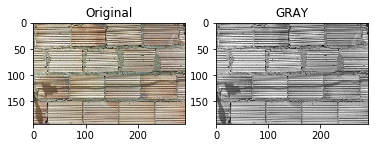

2 100 600
Average area 19.4 29.2 600 6000


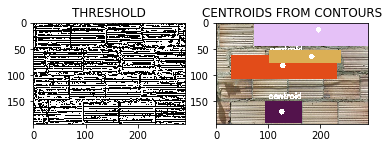

No. of Centroids:  4


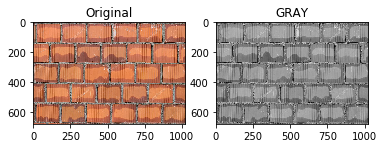

3 1000 7000
Average area 68.2 102.3 7000 70000


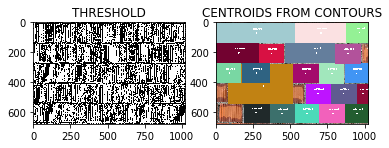

No. of Centroids:  21


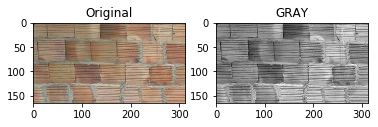

2 100 500
Average area 16.5 31.3 500 5000


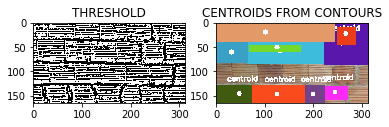

No. of Centroids:  10


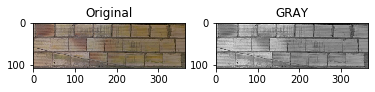

2 100 400
Average area 10.8 36.5 400 4000


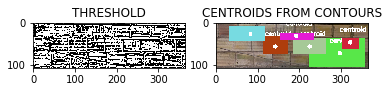

No. of Centroids:  6


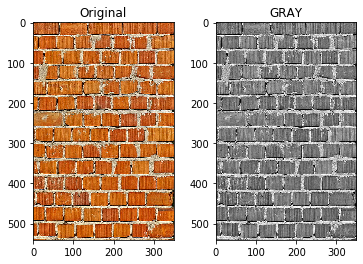

3 1000 2000
Average area 54.1 35.0 2000 20000


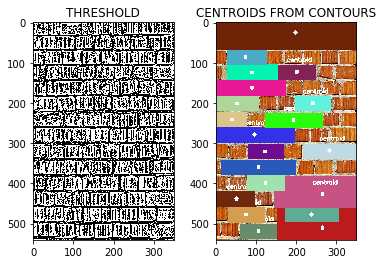

No. of Centroids:  21


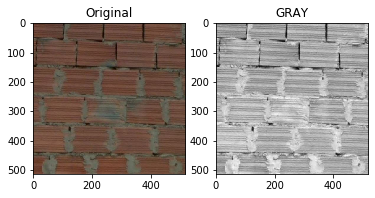

3 1000 3000
Average area 51.3 51.8 3000 30000


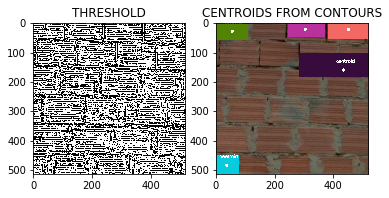

No. of Centroids:  5


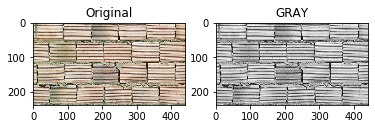

3 1000 1000
Average area 23.8 44.1 1000 10000


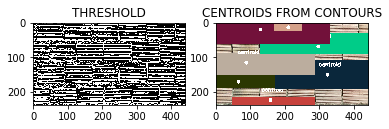

No. of Centroids:  7


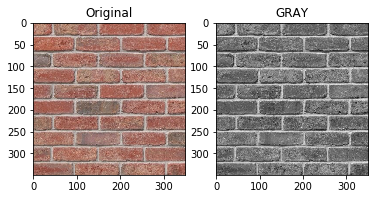

3 1000 1000
Average area 35.0 35.0 1000 10000


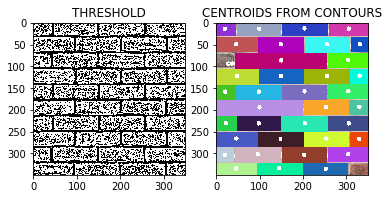

No. of Centroids:  36


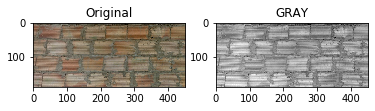

2 100 900
Average area 18.9 45.2 900 9000


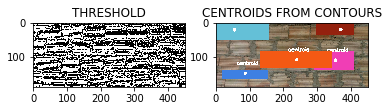

No. of Centroids:  5


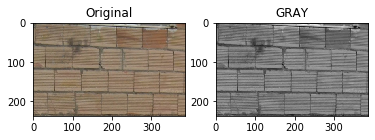

2 100 900
Average area 23.7 38.7 900 9000


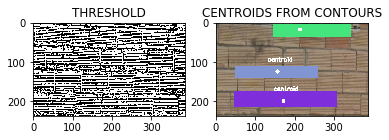

No. of Centroids:  3


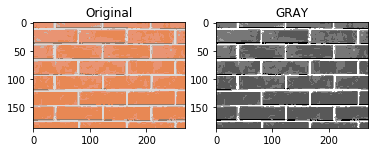

2 100 500
Average area 18.7 27.0 500 5000


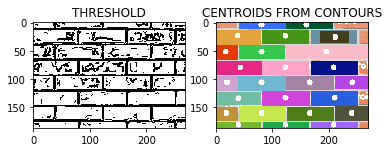

No. of Centroids:  26


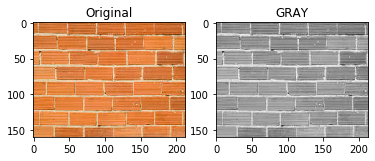

2 100 300
Average area 16.0 21.3 300 3000


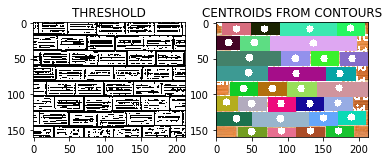

No. of Centroids:  31


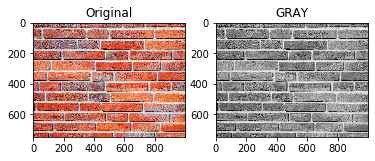

3 1000 8000
Average area 75.0 100.0 8000 80000


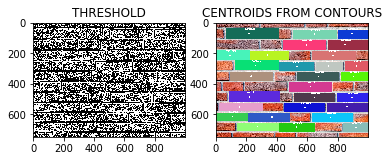

No. of Centroids:  28


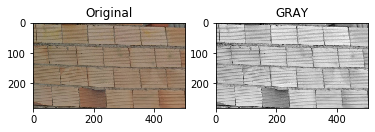

3 1000 1000
Average area 28.1 50.4 1000 10000


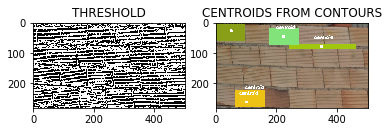

No. of Centroids:  5


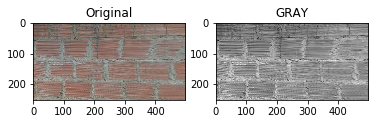

3 1000 1000
Average area 25.2 49.8 1000 10000


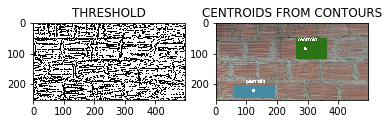

No. of Centroids:  2


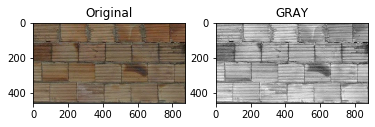

3 1000 4000
Average area 45.8 87.5 4000 40000


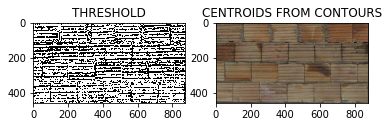

No. of Centroids:  0


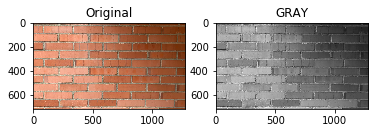

3 1000 9000
Average area 72.0 128.0 9000 90000


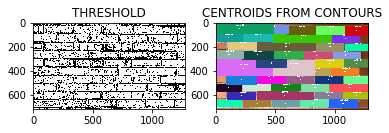

No. of Centroids:  44


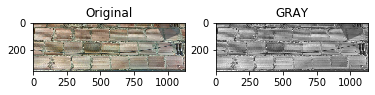

3 1000 4000
Average area 35.5 113.0 4000 40000


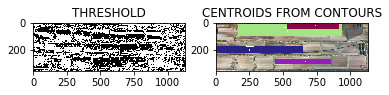

No. of Centroids:  4


In [7]:
# REAL WALL IMAGES
path = "C:/Users/NFT Build Change/Desktop/Colombia/Git Repo ISAC-SIMO/ISAC-SIMO/Notebooks/Test Images Real Walls"+"/"
import os
import random
realimagespath = loadImages(path)
random.shuffle(realimagespath)
for i,filepath in enumerate(realimagespath):
    
    centroids = adaptivegaussian(filepath)

#### Method 2:

### Step 2: Calculate horizontal offsets from centroids

#### Step 2.1: Group centroids by row
The first step in 2.1 is to group the centroid points by rows. This can be done by comparing the y coordinate of centroid points